In [1]:
import numpy as np
import dicom
import os
import fnmatch
import re
import cv2


%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
f = dicom.read_file('/Users/csmfindling/Documents/Kaggle/HeartDisease/data/data_kaggle/train/1/study/2ch_21/IM-4572-0002.dcm')

In [3]:
img = f.pixel_array.astype(np.int)

/Users/csmfindling/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


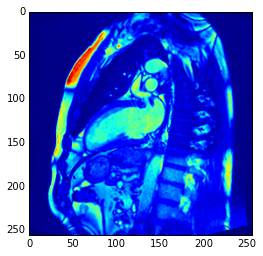

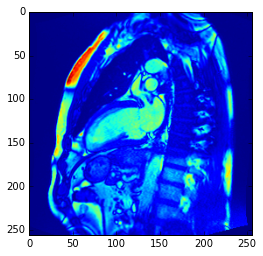

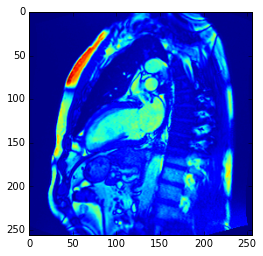

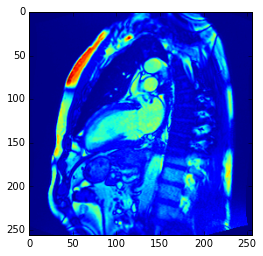

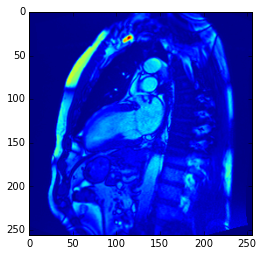

...

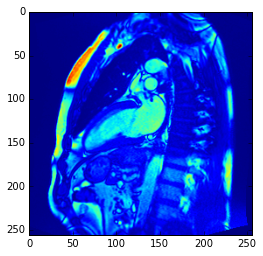

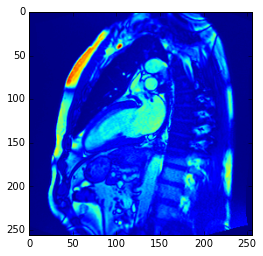

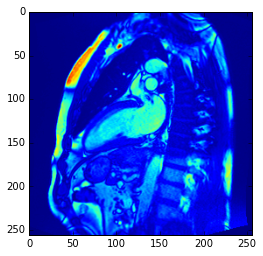

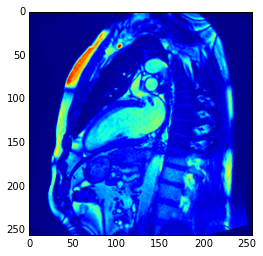

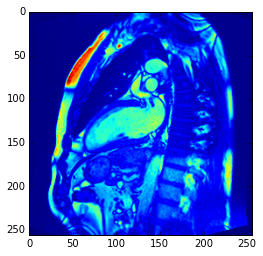

In [4]:
for i in range(30):
    plt.figure()
    f = dicom.read_file('/Users/csmfindling/Documents/Kaggle/HeartDisease/data/data_kaggle/train/1/study/2ch_21/IM-4572-00%.2d.dcm'%(i+1))
    img = f.pixel_array.astype(np.int)
    plt.imshow(img)

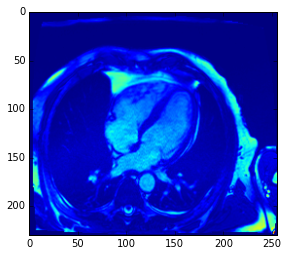

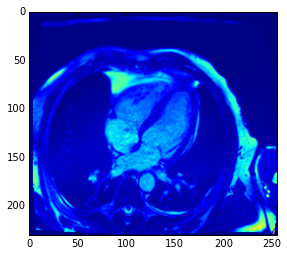

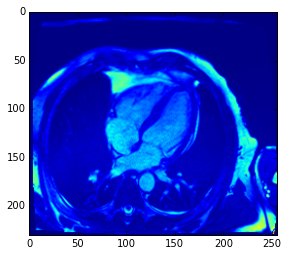

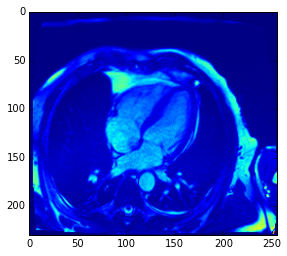

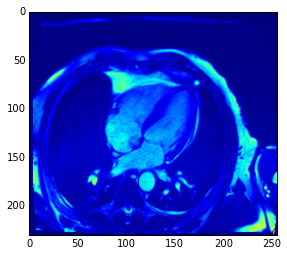

...

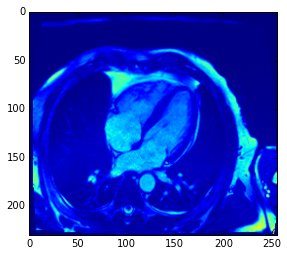

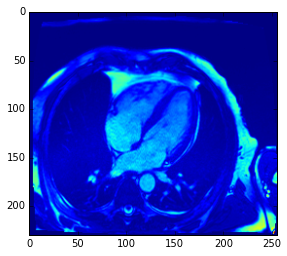

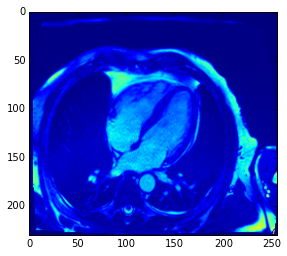

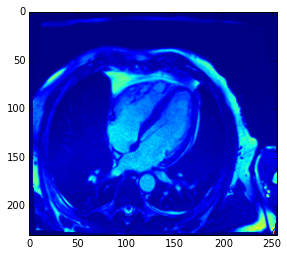

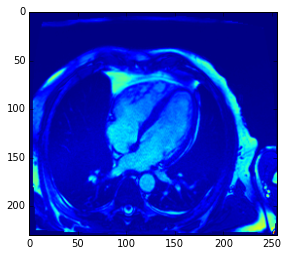

In [5]:
for i in range(30):
    plt.figure()
    f = dicom.read_file('/Users/csmfindling/Documents/Kaggle/HeartDisease/data/data_kaggle/train/1/study/4ch_20/IM-4571-00%.2d.dcm'%(i+1))
    img = f.pixel_array.astype(np.int)
    plt.imshow(img)

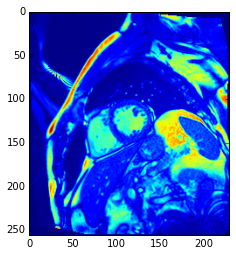

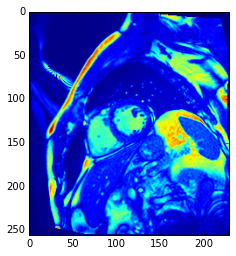

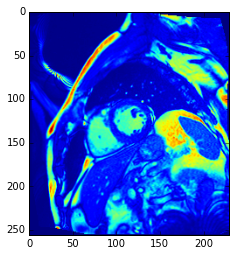

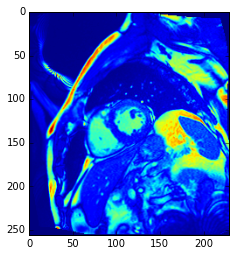

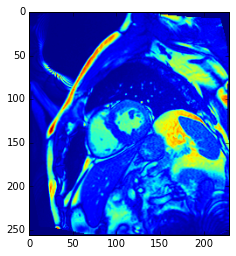

...

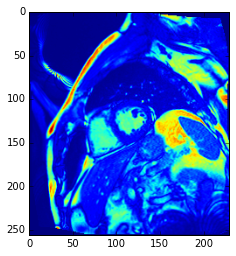

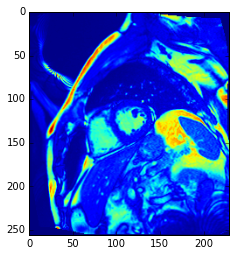

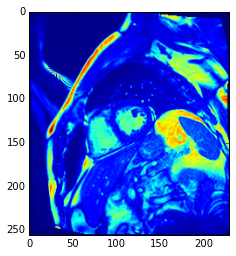

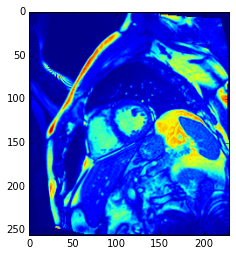

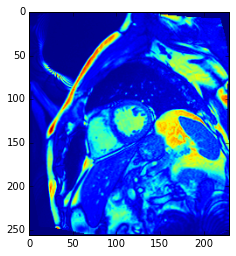

In [6]:
for i in range(30):
    plt.figure()
    f = dicom.read_file('/Users/csmfindling/Documents/Kaggle/HeartDisease/data/data_kaggle/train/1/study/sax_10/IM-4562-00%.2d.dcm'%(i+1))
    img = f.pixel_array.astype(np.int)
    plt.imshow(img)

In [55]:
SAX_SERIES = {
    # challenge online
    "SC-HF-I-09" : "0241",  # ['IM-0241-0278.dcm']
    "SC-HF-I-10" : "0024",  # ['IM-0024-0220.dcm', 'IM-0034-0220.dcm']"
    "SC-HF-I-11" : "0043",  #,"['IM-0043-0220.dcm', 'IM-0047-0220.dcm']"
    "SC-HF-I-12" : "0062",  #['IM-0062-0220.dcm']
    "SC-HF-NI-12" : "0286", #['IM-0286-0260.dcm']
    "SC-HF-NI-13" : "0304", #['IM-0304-0220.dcm']
    "SC-HF-NI-14" : "0330", #['IM-0330-0216.dcm', 'IM-0331-0216.dcm', 'IM-0332-0216.dcm']"
    "SC-HF-NI-15" : "0359", #['IM-0359-0220.dcm']
    "SC-HYP-09" : "0003",   # ['IM-0003-0220.dcm', 'IM-0004-0220.dcm', 'IM-0007-0220.dcm']"
    "SC-HYP-10" : "0579",   #['IM-0579-0180.dcm', 'IM-0583-0180.dcm', 'IM-0592-0180.dcm']"
    "SC-HYP-11" : "0601",   #"['IM-0601-0200.dcm', 'IM-0606-0200.dcm']"
    "SC-HYP-12" : "0629",   #"['IM-0629-0180.dcm', 'IM-0645-0180.dcm']"
    "SC-N-09" : "1031",     #"['IM-1031-0160.dcm', 'IM-1032-0160.dcm', 'IM-1034-0160.dcm']"
    "SC-N-10" : "0851",     #"['IM-0851-0200.dcm', 'IM-0853-0200.dcm', 'IM-0855-0200.dcm']"
    "SC-N-11" : "0877",     #"['IM-0877-0180.dcm', 'IM-0878-0180.dcm', 'IM-0882-0180.dcm']"
    # challenge training
    "SC-HF-I-1": "0004", #,"['IM-0004-0219.dcm', 'IM-0005-0219.dcm']"
    "SC-HF-I-2": "0106",
    "SC-HF-I-4": "0116",
    "SC-HF-I-40": "0134",
    "SC-HF-NI-3": "0379",
    "SC-HF-NI-4": "0501",
    "SC-HF-NI-34": "0446",
    "SC-HF-NI-36": "0474",
    "SC-HYP-1": "0550",
    "SC-HYP-3": "0650",
    "SC-HYP-38": "0734",
    "SC-HYP-40": "0755",
    "SC-N-2": "0898",
    "SC-N-3": "0915",
    "SC-N-40": "0944",    
}

SUNNYBROOK_ROOT_PATH = "/Users/csmfindling/Documents/Kaggle/HeartDisease/data/data_segmentation/"

TRAIN_CONTOUR_PATH = os.path.join(SUNNYBROOK_ROOT_PATH,
                            "SunnybrookCardiacMRDatabaseContoursPart1",
                            "OnlineDataContours")
TRAIN_IMG_PATH = os.path.join(SUNNYBROOK_ROOT_PATH,
                        "challenge_online")

def shrink_case(case):
    toks = case.split("-")
    def shrink_if_number(x):
        try:
            cvt = int(x)
            return str(cvt)
        except ValueError:
            return x
    return "-".join([shrink_if_number(t) for t in toks])

class Contour(object):
    def __init__(self, ctr_path):
        self.ctr_path = ctr_path
        match = re.search(r"/([^/]*)/contours-manual/IRCCI-expert/IM-0001-(\d{4})-icontour-manual.txt", ctr_path)
        self.case = shrink_case(match.group(1))
        self.img_no = int(match.group(2))
    
    def __str__(self):
        return "<Contour for case %s, image %d>" % (self.case, self.img_no)
    
    __repr__ = __str__

def load_contour(contour, img_path):
    filename = "IM-%s-%04d.dcm" % (SAX_SERIES[contour.case], contour.img_no)
    full_path = os.path.join(img_path, contour.case, filename)
    f = dicom.read_file(full_path)
    img = f.pixel_array.astype(np.int)
    ctrs = np.loadtxt(contour.ctr_path, delimiter=" ").astype(np.int)
    label = np.zeros_like(img, dtype="uint8")
    cv2.fillPoly(label, [ctrs], 1)
    return img, label
    
def get_all_contours(contour_path):
    contours = [os.path.join(dirpath, f)
        for dirpath, dirnames, files in os.walk(contour_path)
        for f in fnmatch.filter(files, 'IM-0001-*-icontour-manual.txt')]
    print("Shuffle data")
  #  np.random.shuffle(contours)
    print("Number of examples: {:d}".format(len(contours)))
    extracted = map(Contour, contours)
    return extracted

def export_all_contours(contours, img_path, lmdb_img_name, lmdb_label_name):
    for lmdb_name in [lmdb_img_name, lmdb_label_name]:
        db_path = os.path.abspath(lmdb_name)
        if os.path.exists(db_path):
            shutil.rmtree(db_path)
    counter_img = 0
    counter_label = 0
    batchsz = 100
    print("Processing {:d} images and labels...".format(len(contours)))
    for i in xrange(int(np.ceil(len(contours) / float(batchsz)))):
        batch = contours[(batchsz*i):(batchsz*(i+1))]
        if len(batch) == 0:
            break
        imgs, labels = [], []
        for idx,ctr in enumerate(batch):
            try:
                img, label = load_contour(ctr, img_path)
                imgs.append(img)
                labels.append(label)
                if idx % 20 == 0:
                    print ctr
                    plt.imshow(img)
                    plt.show()
                    plt.imshow(label)
                    plt.show()
            except IOError:
                continue
        db_imgs = lmdb.open(lmdb_img_name, map_size=1e12)
        with db_imgs.begin(write=True) as txn_img:
            for img in imgs:
                datum = caffe.io.array_to_datum(np.expand_dims(img, axis=0))
                txn_img.put("{:0>10d}".format(counter_img), datum.SerializeToString())
                counter_img += 1
        print("Processed {:d} images".format(counter_img))
        db_labels = lmdb.open(lmdb_label_name, map_size=1e12)
        with db_labels.begin(write=True) as txn_label:
            for lbl in labels:
                datum = caffe.io.array_to_datum(np.expand_dims(lbl, axis=0))
                txn_label.put("{:0>10d}".format(counter_label), datum.SerializeToString())
                counter_label += 1
        print("Processed {:d} labels".format(counter_label))
    db_imgs.close()
    db_labels.close()

In [71]:
ze={"SC-HF-I-09" : "0241",  # OBVIOUS           ['IM-0241-0278.dcm']
    "SC-HF-I-10" : "0024",  # DONE              ['IM-0024-0220.dcm', 'IM-0034-0220.dcm']"
    "SC-HF-I-11" : "0043",  # DONE              ['IM-0043-0220.dcm', 'IM-0047-0220.dcm']"
    "SC-HF-I-12" : "0062",  # OBVIOUS           ['IM-0062-0220.dcm']
    "SC-HF-NI-12" : "0286", # OBVIOUS           ['IM-0286-0260.dcm']
    "SC-HF-NI-13" : "0304", # OBVIOUS           ['IM-0304-0220.dcm']
    "SC-HF-NI-14" : "0331", # DONE              ['IM-0330-0216.dcm', 'IM-0331-0216.dcm', 'IM-0332-0216.dcm']"
    "SC-HF-NI-15" : "0359", # OBVIOUS           ['IM-0359-0220.dcm']
    "SC-HYP-09" : "0003",   # DONE              ['IM-0003-0220.dcm', 'IM-0004-0220.dcm', 'IM-0007-0220.dcm']"
    "SC-HYP-10" : "0579",   # TO VERIFY !! DONE ['IM-0579-0180.dcm', 'IM-0583-0180.dcm', 'IM-0592-0180.dcm']"
    "SC-HYP-11" : "0606",   # DONE              ['IM-0601-0200.dcm', 'IM-0606-0200.dcm']"
    "SC-HYP-12" : "0629",   # DONT KNOW         ['IM-0629-0180.dcm', 'IM-0645-0180.dcm']"
    "SC-N-09" : "1031",     # DONT KNOW         ['IM-1031-0160.dcm', 'IM-1032-0160.dcm', 'IM-1034-0160.dcm']"
    "SC-N-10" : "0851",     # DONE              ['IM-0851-0200.dcm', 'IM-0853-0200.dcm', 'IM-0855-0200.dcm']"
    "SC-N-11" : "0878",  }  # DONE              ['IM-0877-0180.dcm', 'IM-0878-0180.dcm', 'IM-0882-0180.dcm']"

Shuffle data
Number of examples: 279
Shuffle data
Number of examples: 279
Shuffle data
Number of examples: 279


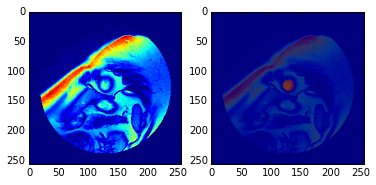

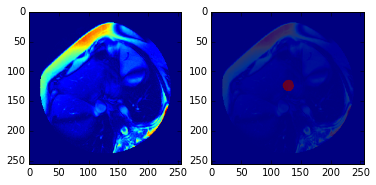

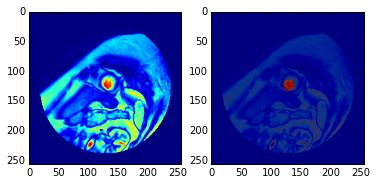

In [136]:
# To only print last image
name = 'SC-HYP-9'
list_sax_possibilities = ['0003', '0004', '0007']
contours = []
for i in range(len(list_sax_possibilities)):
    SAX_SERIES[name] = list_sax_possibilities[i]
    ctrs = get_all_contours(TRAIN_CONTOUR_PATH)
    for j in range(279):
        if ctrs[j].case == name and ctrs[j].img_no == 220:
            ctrs_index = j
            contours.append(load_contour(ctrs[ctrs_index], TRAIN_IMG_PATH))
            break
assert(len(contours) > 0)

for i in range(len(list_sax_possibilities)):
    plt.figure()
    plt.subplot(1,2,1)
    plt.imshow(contours[i][0])
    plt.subplot(1,2,2)
    plt.imshow(contours[i][0])
    plt.imshow(contours[i][1], alpha=0.8)

Shuffle data
Number of examples: 279
Shuffle data
Number of examples: 279


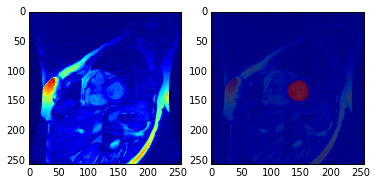

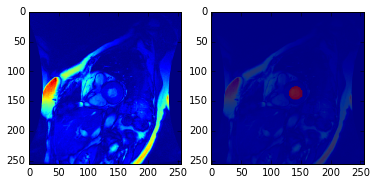

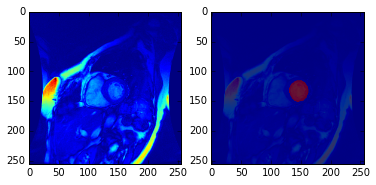

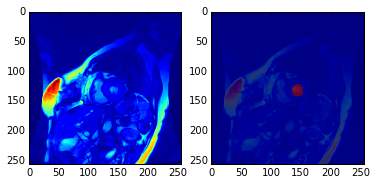

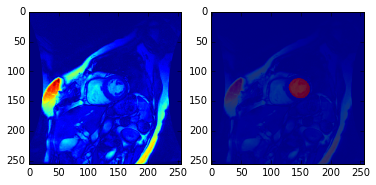

...

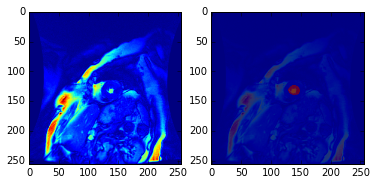

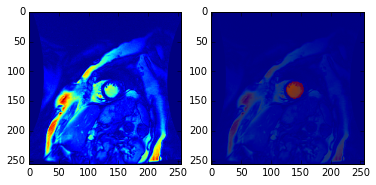

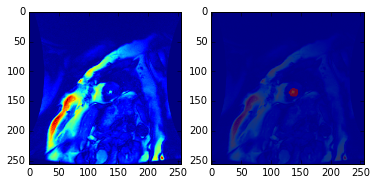

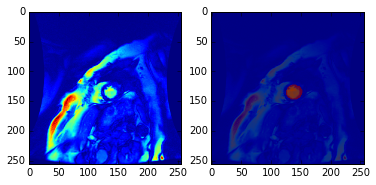

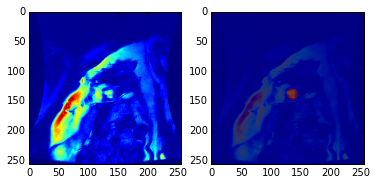

In [157]:
# To print the two sequences - much better to discriminate if 
name = 'SC-HYP-12'
list_sax_possibilities = ['0629', '0645']
contoursAllOfIndexes = []
for i in range(len(list_sax_possibilities)):
    SAX_SERIES[name] = list_sax_possibilities[i]
    ctrs = get_all_contours(TRAIN_CONTOUR_PATH)
    contoursOfOneIndex = []
    for j in range(279):
        if ctrs[j].case == name:
            contoursOfOneIndex.append(load_contour(ctrs[j], TRAIN_IMG_PATH))
    contoursAllOfIndexes.append(contoursOfOneIndex)
assert(len(contoursAllOfIndexes) > 0)

# For one index
index = 0; length = len(contoursAllOfIndexes[index])
contoursOfInterest = contoursAllOfIndexes[index]
for i in range(length):
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(contoursOfInterest[i][0])
    plt.subplot(1, 2, 2)
    plt.imshow(contoursOfInterest[i][0])
    plt.imshow(contoursOfInterest[i][1], alpha=0.8)

In [137]:
l = len(contoursAllOfIndexes[0])
for i in range(len(contoursAllOfIndexes)):
    for j in range(l):
        plt.figure()
        plt.subplot(l, 2*len(contoursAllOfIndexes), i * 2*len(contoursAllOfIndexes) + j)
        plt.imshow(contours[i][0])
        plt.subplot(l, 2*len(contoursAllOfIndexes), i * 2*len(contoursAllOfIndexes) + j+1)
        plt.imshow(contours[i][0])
        plt.imshow(contours[i][1], alpha=0.8)

2

In [100]:
for j in range(279)
differentNames = []
for j in range(260):
    if ctrs[j].case not in differentNames:
        differentNames.append(ctrs[j].case)
   # if ctrs[j].case == 'SC-N-11':
    #    print 'ok'

In [101]:
differentNames

['SC-HF-I-9',
 'SC-HF-I-10',
 'SC-HF-I-11',
 'SC-HF-I-12',
 'SC-HF-NI-12',
 'SC-HF-NI-13',
 'SC-HF-NI-14',
 'SC-HF-NI-15',
 'SC-HYP-9',
 'SC-HYP-10',
 'SC-HYP-11',
 'SC-HYP-12',
 'SC-N-9',
 'SC-N-10']

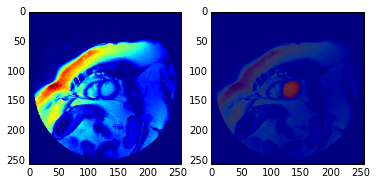

In [26]:
plt.subplot(1,2,1)
plt.imshow(ctr[0])
plt.subplot(1,2,2)
plt.imshow(ctr[0])
plt.imshow(ctr[1], alpha=0.8)

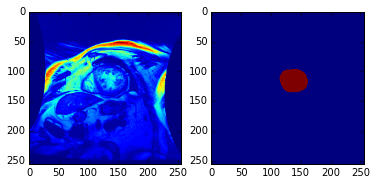

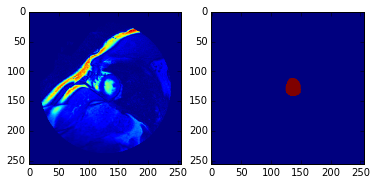

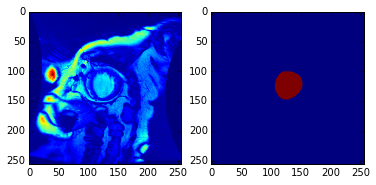

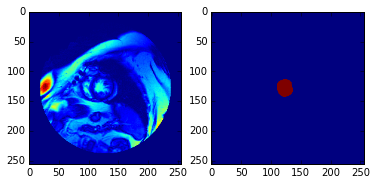

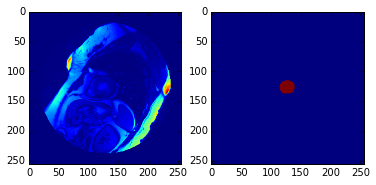

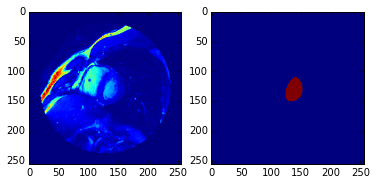

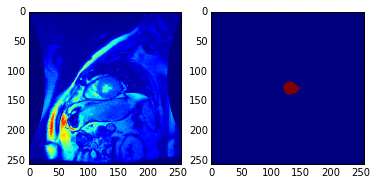

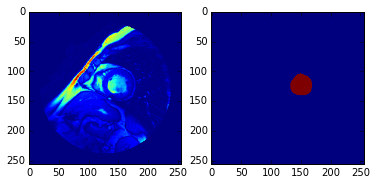

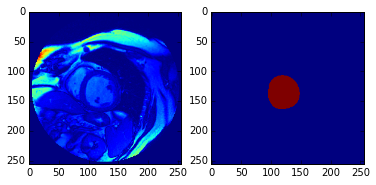

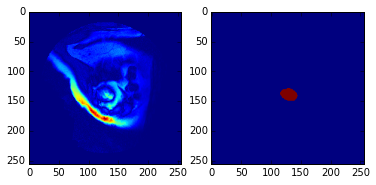

In [61]:
for i in range(10):
    plt.figure()
    
    ctr = load_contour(ctrs[i], TRAIN_IMG_PATH)
    plt.subplot(1,2,1)
    plt.imshow(ctr[0])
    plt.subplot(1,2,2)
    plt.imshow(ctr[1])